In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)


In [6]:
df = pd.read_csv(r'C:\Users\PC\OneDrive\Desktop\Projects\pyth\movies.csv')

In [8]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [10]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [12]:
print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [146]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,4693,6,6,1980,1301,8.4,927000.0,1796,2837,695,46,19000000,46998772,1426,146.0,1235,1980-06-13,1980,6
1,3931,6,1,1980,1124,5.8,65000.0,1577,1157,214,47,4500000,58853106,450,104.0,1061,1980-07-02,1980,5
2,3643,4,0,1980,1356,8.7,1200000.0,756,1819,1155,47,18000000,538375067,944,124.0,1284,1980-06-20,1980,6
3,205,4,4,1980,1124,7.7,221000.0,887,1413,1471,47,3500000,83453539,1109,88.0,1061,1980-07-02,1980,5
4,734,6,4,1980,1167,7.3,108000.0,718,350,271,47,6000000,39846344,1084,98.0,1104,1980-07-25,1980,5


In [16]:
df = df[df['budget'].notna() & df['gross'].notna()]  # remove NaNs
df = df[~df['budget'].isin([float('inf'), float('-inf')])]
df = df[~df['gross'].isin([float('inf'), float('-inf')])]

# Now safely convert to integers
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')


In [18]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0


In [26]:
# Remove anything in parentheses and strip whitespace
df['released_clean'] = df['released'].str.replace(r"\(.*\)", "", regex=True).str.strip()

# Convert to datetime and extract the year
df['release_date'] = pd.to_datetime(df['released_clean'], errors='coerce')
df['release_year'] = df['release_date'].dt.year

# View the results
print(df[['released', 'released_clean', 'release_date', 'release_year']].head())


                        released released_clean release_date  release_year
0  June 13, 1980 (United States)  June 13, 1980   1980-06-13        1980.0
1   July 2, 1980 (United States)   July 2, 1980   1980-07-02        1980.0
2  June 20, 1980 (United States)  June 20, 1980   1980-06-20        1980.0
3   July 2, 1980 (United States)   July 2, 1980   1980-07-02        1980.0
4  July 25, 1980 (United States)  July 25, 1980   1980-07-25        1980.0


In [33]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,released_clean,release_date,release_year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,NaT,"June 13, 1980",1980-06-13,1980.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,NaT,"July 2, 1980",1980-07-02,1980.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,NaT,"June 20, 1980",1980-06-20,1980.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,NaT,"July 2, 1980",1980-07-02,1980.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,NaT,"July 25, 1980",1980-07-25,1980.0


In [35]:
df = df.drop('yearcorrect', axis=1)

In [37]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,"June 13, 1980",1980-06-13,1980.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,"July 2, 1980",1980-07-02,1980.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,"June 20, 1980",1980-06-20,1980.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,"July 2, 1980",1980-07-02,1980.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,"July 25, 1980",1980-07-25,1980.0


In [39]:
print(df.dtypes)

name                      object
rating                    object
genre                     object
year                       int64
released                  object
score                    float64
votes                    float64
director                  object
writer                    object
star                      object
country                   object
budget                     int64
gross                      int64
company                   object
runtime                  float64
released_clean            object
release_date      datetime64[ns]
release_year             float64
dtype: object


In [45]:
df = df[df['release_year'].notna() ]  # remove NaNs
df = df[~df['release_year'].isin([float('inf'), float('-inf')])]

df['release_year'] = df['release_year'].astype('int64')

In [47]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,"June 13, 1980",1980-06-13,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,"July 2, 1980",1980-07-02,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,"June 20, 1980",1980-06-20,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,"July 2, 1980",1980-07-02,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,"July 25, 1980",1980-07-25,1980


In [148]:
df.sort_values(by=['gross'],inplace=False, ascending=False)
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,4693,6,6,1980,1301,8.4,927000.0,1796,2837,695,46,19000000,46998772,1426,146.0,1235,1980-06-13,1980,6
1,3931,6,1,1980,1124,5.8,65000.0,1577,1157,214,47,4500000,58853106,450,104.0,1061,1980-07-02,1980,5
2,3643,4,0,1980,1356,8.7,1200000.0,756,1819,1155,47,18000000,538375067,944,124.0,1284,1980-06-20,1980,6
3,205,4,4,1980,1124,7.7,221000.0,887,1413,1471,47,3500000,83453539,1109,88.0,1061,1980-07-02,1980,5
4,734,6,4,1980,1167,7.3,108000.0,718,350,271,47,6000000,39846344,1084,98.0,1104,1980-07-25,1980,5


In [51]:
pd.set_option('display.max_rows',None)

In [150]:
df.drop_duplicates()
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,4693,6,6,1980,1301,8.4,927000.0,1796,2837,695,46,19000000,46998772,1426,146.0,1235,1980-06-13,1980,6
1,3931,6,1,1980,1124,5.8,65000.0,1577,1157,214,47,4500000,58853106,450,104.0,1061,1980-07-02,1980,5
2,3643,4,0,1980,1356,8.7,1200000.0,756,1819,1155,47,18000000,538375067,944,124.0,1284,1980-06-20,1980,6
3,205,4,4,1980,1124,7.7,221000.0,887,1413,1471,47,3500000,83453539,1109,88.0,1061,1980-07-02,1980,5
4,734,6,4,1980,1167,7.3,108000.0,718,350,271,47,6000000,39846344,1084,98.0,1104,1980-07-25,1980,5


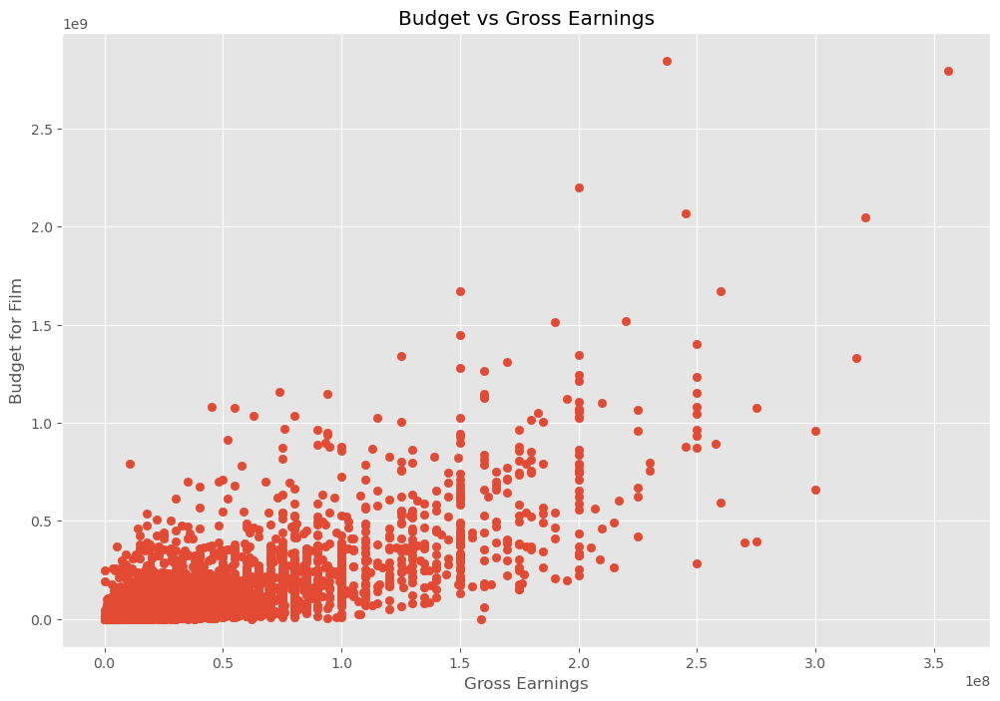

In [59]:
plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')
plt.show()

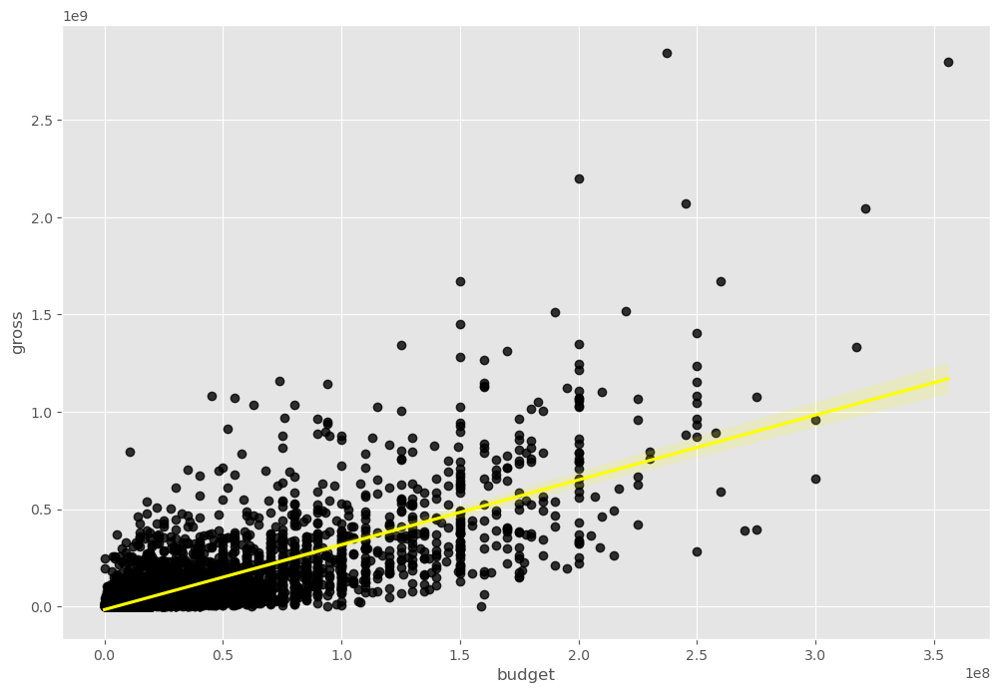

In [69]:
sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color" : "black"}, line_kws={"color":"yellow"})
plt.show()

In [73]:
non_numeric = df.select_dtypes(exclude=['number']).columns
print("Non-numeric columns:", non_numeric)


Non-numeric columns: Index(['name', 'rating', 'genre', 'released', 'director', 'writer', 'star',
       'country', 'company', 'released_clean', 'release_date'],
      dtype='object')


In [86]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = numeric_df.corr()


In [91]:
numeric_df.corr()

,year,score,votes,budget,gross,runtime,release_year
year,1.000000,0.054468,0.204646,0.326805,0.273459,0.073973,0.998876
score,0.054468,1.000000,0.474145,0.071344,0.222090,0.415012,0.060547
votes,0.204646,0.474145,1.000000,0.439426,0.614587,0.352397,0.202004
budget,0.326805,0.071344,0.439426,1.000000,0.740177,0.318254,0.319605
gross,0.273459,0.222090,0.614587,0.740177,1.000000,0.275441,0.268049
runtime,0.073973,0.415012,0.352397,0.318254,0.275441,1.000000,0.074320
release_year,0.998876,0.060547,0.202004,0.319605,0.268049,0.074320,1.000000


In [93]:
numeric_df.corr(method='pearson')

,year,score,votes,budget,gross,runtime,release_year
year,1.000000,0.054468,0.204646,0.326805,0.273459,0.073973,0.998876
score,0.054468,1.000000,0.474145,0.071344,0.222090,0.415012,0.060547
votes,0.204646,0.474145,1.000000,0.439426,0.614587,0.352397,0.202004
budget,0.326805,0.071344,0.439426,1.000000,0.740177,0.318254,0.319605
gross,0.273459,0.222090,0.614587,0.740177,1.000000,0.275441,0.268049
runtime,0.073973,0.415012,0.352397,0.318254,0.275441,1.000000,0.074320
release_year,0.998876,0.060547,0.202004,0.319605,0.268049,0.074320,1.000000


In [95]:
numeric_df.corr(method='kendall')

,year,score,votes,budget,gross,runtime,release_year
year,1.000000,0.038068,0.294094,0.219802,0.237657,0.064082,0.991466
score,0.038068,1.000000,0.350617,-0.007184,0.124374,0.293315,0.042522
votes,0.294094,0.350617,1.000000,0.344858,0.552356,0.205834,0.291166
budget,0.219802,-0.007184,0.344858,1.000000,0.511485,0.230311,0.212852
gross,0.237657,0.124374,0.552356,0.511485,1.000000,0.176576,0.230929
runtime,0.064082,0.293315,0.205834,0.230311,0.176576,1.000000,0.064186
release_year,0.991466,0.042522,0.291166,0.212852,0.230929,0.064186,1.000000


In [97]:
numeric_df.corr(method='spearman')

,year,score,votes,budget,gross,runtime,release_year
year,1.000000,0.055793,0.424232,0.311385,0.348347,0.094327,0.998886
score,0.055793,1.000000,0.496070,-0.011130,0.182341,0.413666,0.062375
votes,0.424232,0.496070,1.000000,0.491561,0.744487,0.301250,0.420373
budget,0.311385,-0.011130,0.491561,1.000000,0.692387,0.329490,0.301354
gross,0.348347,0.182341,0.744487,0.692387,1.000000,0.256748,0.338517
runtime,0.094327,0.413666,0.301250,0.329490,0.256748,1.000000,0.094569
release_year,0.998886,0.062375,0.420373,0.301354,0.338517,0.094569,1.000000


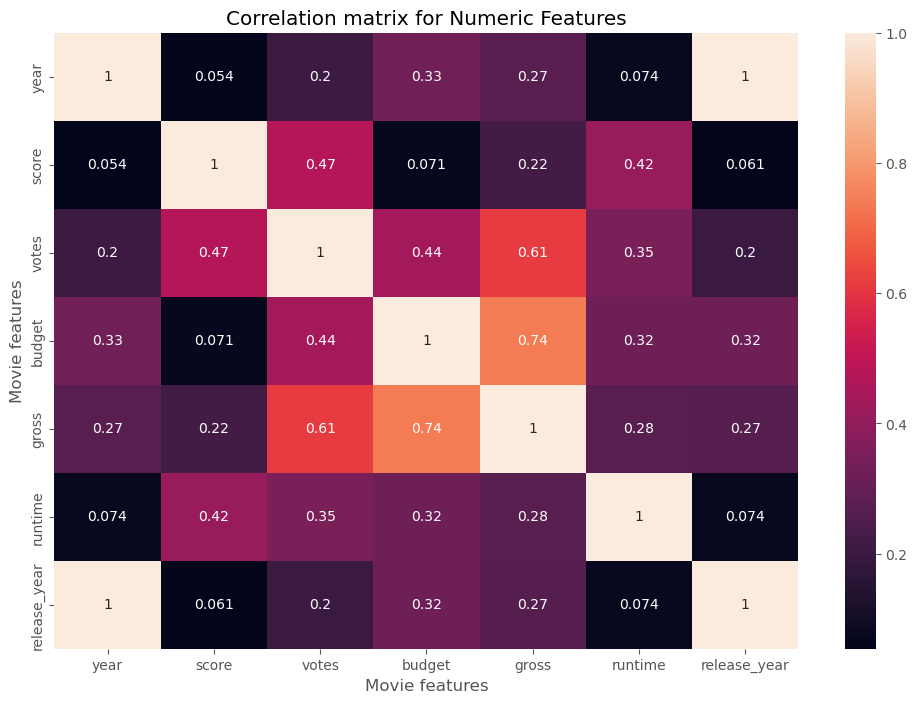

In [101]:
correlation_matrix = numeric_df.corr()

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Numeric Features")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [103]:
correlation_mat = df.apply(lambda x: x.factorize()[0]).corr()

corr_pairs = correlation_mat.unstack()

print(corr_pairs)

name            name              1.000000
                rating            0.169940
                genre             0.030520
                year              0.965402
                released          0.966070
                score            -0.021335
                votes             0.294301
                director          0.724828
                writer            0.792866
                star              0.694913
                country           0.096862
                budget            0.289159
                gross             0.967911
                company           0.536055
                runtime           0.048924
                released_clean    0.966164
                release_date      0.966164
                release_year      0.931730
rating          name              0.169940
                rating            1.000000
                genre            -0.114472
                year              0.179541
                released          0.171123
           

In [105]:
sorted_pairs = corr_pairs.sort_values(kind="quicksort")

print(sorted_pairs)

genre           rating           -0.114472
rating          genre            -0.114472
company         budget           -0.051767
budget          company          -0.051767
score           votes            -0.041305
votes           score            -0.041305
runtime         director         -0.028227
director        runtime          -0.028227
company         rating           -0.028173
rating          company          -0.028173
score           genre            -0.025843
genre           score            -0.025843
score           writer           -0.022612
writer          score            -0.022612
name            score            -0.021335
score           name             -0.021335
votes           country          -0.021134
country         votes            -0.021134
released        score            -0.020756
score           released         -0.020756
                release_date     -0.019472
released_clean  score            -0.019472
release_date    score            -0.019472
score      

In [107]:
# We can now take a look at the ones that have a high correlation (> 0.5)

strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5]

print(strong_pairs)

company         release_year      0.518219
release_year    company           0.518219
company         name              0.536055
name            company           0.536055
company         year              0.538372
year            company           0.538372
company         release_date      0.544532
                released_clean    0.544532
release_date    company           0.544532
released_clean  company           0.544532
gross           company           0.546604
company         gross             0.546604
                released          0.546735
released        company           0.546735
star            writer            0.627432
writer          star              0.627432
star            director          0.636454
director        star              0.636454
name            star              0.694913
star            name              0.694913
                release_year      0.697904
release_year    star              0.697904
director        writer            0.717769
writer     

In [109]:
CompanyGrossSum = df.groupby('company')[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values('gross', ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
Warner Bros.                 54773202654
Universal Pictures           51241105418
Columbia Pictures            42356430218
Paramount Pictures           40021704691
Twentieth Century Fox        39541625997
Walt Disney Pictures         35833650748
New Line Cinema              19628786232
Marvel Studios               15065592411
DreamWorks Animation         11873612858
Dreamworks Pictures          11593807697
Touchstone Pictures          10664679494
Metro-Goldwyn-Mayer (MGM)     8936980277
Summit Entertainment          8318570396
Pixar Animation Studios       7886344526
Fox 2000 Pictures             7243673721
Name: gross, dtype: int64

In [111]:
df['Year'] = df['released'].astype(str).str[:4]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,"June 13, 1980",1980-06-13,1980,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,"July 2, 1980",1980-07-02,1980,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,"June 20, 1980",1980-06-20,1980,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,"July 2, 1980",1980-07-02,1980,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,"July 25, 1980",1980-07-25,1980,July
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,"May 9, 1980",1980-05-09,1980,May
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,"June 20, 1980",1980-06-20,1980,June
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,"December 19, 1980",1980-12-19,1980,Dece
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,"June 19, 1981",1981-06-19,1981,June
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,"May 16, 1980",1980-05-16,1980,May


In [113]:
df.groupby(['company', 'year'])[["gross"]].sum()

gross
company                                            year            
"DIA" Productions GmbH & Co. KG                    2003    44350926
"Weathering With You" Film Partners                2019   193457467
.406 Production                                    1996       10580
1492 Pictures                                      1996   129832389
                                                   1999    87423861
1818 Productions                                   1983    12232628
19 Entertainment                                   2003     4928883
1978 Films                                         2017    40656399
1984 Private Defense Contractors                   2014    58834384
2 Loop Films                                       2002      264349
2.0 Entertainment                                  2019   122810399
2.4.7. Films                                       2007    22783978
2003 Productions                                   2004    69424389
20th Century Studios                               2020   111105497
21 Laps Entertainment                              2014    41296320
                                                   2018    41142379
21st Century Film Corporation                      1990     5835247
21st Century Films                                 1994     1702394
25th Hour Productions                              2002    23932055
26 Films                                           2009    20458873
2929 Productions                                   2007     7248490
                                                   2008    28705178
                                                   2014     5092129
2DUX²                                              2016      678150
                                                   2018   197744377
3 Arts Entertainment                               1996    60209334
                                                   1997    75812433
                                                   2001    71186502
                                                   2010      649626
                                                   2013     3909596
                                                   2014   161459297
                                                   2015    36606743
                                                   2019    22386555
3 Miles Apart Productions Ltd.                     1999     8408835
3311 Productions                                   2017     5042014
360 Pictures                                       2007     9669758
3Mark Entertainment                                2001     4760014
4 Kids Entertainment                               1999   133949270
40 Acres & A Mule Filmworks                        1986     7137502
                                                   1989    37295445
                                                   1995    15403436
                                                   1999    34573780
                                                   2000    27728118
                                                   2004     1526951
4Kids Entertainment                                2007    95802916
7 Arts International                               1999      206128
7 Films Cinéma                                     2000     3033646
88 Productions                                     1990    10005969
888 Productions                                    1990   201965915
900 Films                                          2003     5141166
98 MPH Productions                                 2002    80693537
A Band Apart                                       1995     3734870
                                                   1996       49620
                                                   2002    14946150
A&M Films                                          1984     1455045
                                                   1988      161004
                                                   1992     1526697
                                                  

In [115]:
CompanyGrossSum = df.groupby(['company', 'year'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company','year'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company                year
Walt Disney Pictures   2019    5773131804
Marvel Studios         2018    4018631866
Universal Pictures     2015    3834354888
Twentieth Century Fox  2009    3793491246
Walt Disney Pictures   2017    3789382071
Paramount Pictures     2011    3565705182
Warner Bros.           2011    3223799224
Walt Disney Pictures   2010    3104474158
Paramount Pictures     2014    3071298586
Columbia Pictures      2006    2934631933
                       2019    2932757449
Marvel Studios         2019    2797501328
Warner Bros.           2018    2774168962
Columbia Pictures      2011    2738363306
Warner Bros.           2005    2688767210
Name: gross, dtype: int64

In [117]:
CompanyGrossSum = df.groupby(['company'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
Warner Bros.                 54773202654
Universal Pictures           51241105418
Columbia Pictures            42356430218
Paramount Pictures           40021704691
Twentieth Century Fox        39541625997
Walt Disney Pictures         35833650748
New Line Cinema              19628786232
Marvel Studios               15065592411
DreamWorks Animation         11873612858
Dreamworks Pictures          11593807697
Touchstone Pictures          10664679494
Metro-Goldwyn-Mayer (MGM)     8936980277
Summit Entertainment          8318570396
Pixar Animation Studios       7886344526
Fox 2000 Pictures             7243673721
Name: gross, dtype: int64

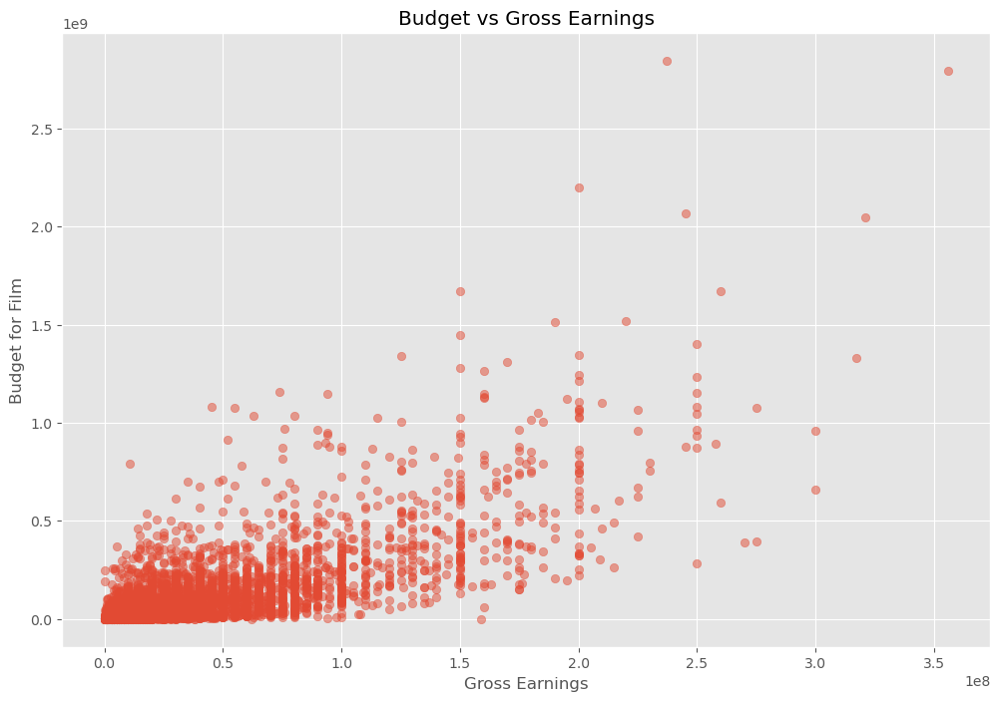

In [119]:
plt.scatter(x=df['budget'], y=df['gross'], alpha=0.5)
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')
plt.show()

In [121]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,"June 13, 1980",1980-06-13,1980,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,"July 2, 1980",1980-07-02,1980,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,"June 20, 1980",1980-06-20,1980,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,"July 2, 1980",1980-07-02,1980,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,"July 25, 1980",1980-07-25,1980,July
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,"May 9, 1980",1980-05-09,1980,May
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,"June 20, 1980",1980-06-20,1980,June
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,"December 19, 1980",1980-12-19,1980,Dece
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,"June 19, 1981",1981-06-19,1981,June
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,"May 16, 1980",1980-05-16,1980,May


In [123]:
df_numerized = df


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
0,4693,6,6,1980,1301,8.4,927000.0,1796,2837,695,46,19000000,46998772,1426,146.0,1235,1980-06-13,1980,6
1,3931,6,1,1980,1124,5.8,65000.0,1577,1157,214,47,4500000,58853106,450,104.0,1061,1980-07-02,1980,5
2,3643,4,0,1980,1356,8.7,1200000.0,756,1819,1155,47,18000000,538375067,944,124.0,1284,1980-06-20,1980,6
3,205,4,4,1980,1124,7.7,221000.0,887,1413,1471,47,3500000,83453539,1109,88.0,1061,1980-07-02,1980,5
4,734,6,4,1980,1167,7.3,108000.0,718,350,271,47,6000000,39846344,1084,98.0,1104,1980-07-25,1980,5
5,1508,6,9,1980,1917,6.4,123000.0,1759,3086,155,47,550000,39754601,1109,95.0,1807,1980-05-09,1980,8
6,3932,6,0,1980,1356,7.9,188000.0,972,575,856,47,27000000,115229890,1397,133.0,1284,1980-06-20,1980,6
7,3123,6,3,1980,525,8.2,330000.0,1268,1256,1466,47,18000000,23402427,388,129.0,494,1980-12-19,1980,2
8,3733,4,0,1980,1343,6.8,101000.0,1607,1402,591,47,54000000,108185706,546,127.0,1272,1981-06-19,1981,6
9,4402,6,3,1980,1752,7.0,10000.0,2013,279,400,47,10000000,15795189,1391,100.0,1652,1980-05-16,1980,8


In [125]:
df_numerized.corr(method='pearson')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_clean,release_date,release_year,Year
name,1.000000,-0.022972,0.009454,0.024005,-0.005587,0.014153,0.012566,0.013140,0.011167,-0.007076,-0.024256,0.023263,0.005608,0.020731,0.011031,-0.005581,0.025344,0.024678,-0.006865
rating,-0.022972,1.000000,0.128689,0.022954,0.019077,0.060069,0.009877,0.014484,-0.006195,0.005097,0.021779,-0.186440,-0.168598,-0.081933,0.134817,0.018344,0.022644,0.023737,0.016455
genre,0.009454,0.128689,1.000000,-0.069917,0.022890,0.034107,-0.135462,-0.010022,0.016433,0.002876,-0.010316,-0.368610,-0.243831,-0.073021,-0.060103,0.022054,-0.065459,-0.065767,0.023122
year,0.024005,0.022954,-0.069917,1.000000,-0.002943,0.054468,0.204646,-0.036192,-0.023513,-0.033142,-0.067040,0.326805,0.273459,-0.014116,0.073973,-0.003090,0.998814,0.998876,-0.007092
released,-0.005587,0.019077,0.022890,-0.002943,1.000000,0.045754,0.028606,0.003325,0.009061,0.015383,-0.016626,0.019571,0.008289,-0.002269,0.008675,0.999951,0.001946,-0.006653,0.996499
score,0.014153,0.060069,0.034107,0.054468,0.045754,1.000000,0.474145,0.006714,0.014506,0.009714,-0.043766,0.071344,0.222090,0.021202,0.415012,0.045984,0.061960,0.060547,0.044787
votes,0.012566,0.009877,-0.135462,0.204646,0.028606,0.474145,1.000000,-0.010250,-0.005454,-0.017600,0.042008,0.439426,0.614587,0.118620,0.352397,0.029392,0.203677,0.202004,0.026901
director,0.013140,0.014484,-0.010022,-0.036192,0.003325,0.006714,-0.010250,1.000000,0.260842,0.035631,0.011432,-0.009385,-0.029481,-0.008287,0.018806,0.003510,-0.035465,-0.035182,0.004573
writer,0.011167,-0.006195,0.016433,-0.023513,0.009061,0.014506,-0.005454,0.260842,1.000000,0.017945,0.021934,-0.039712,-0.036158,-0.003792,-0.016601,0.009149,-0.023180,-0.022966,0.009098
star,-0.007076,0.005097,0.002876,-0.033142,0.015383,0.009714,-0.017600,0.035631,0.017945,1.000000,-0.011255,-0.021992,-0.000425,0.014631,0.012090,0.015228,-0.033023,-0.033425,0.014569


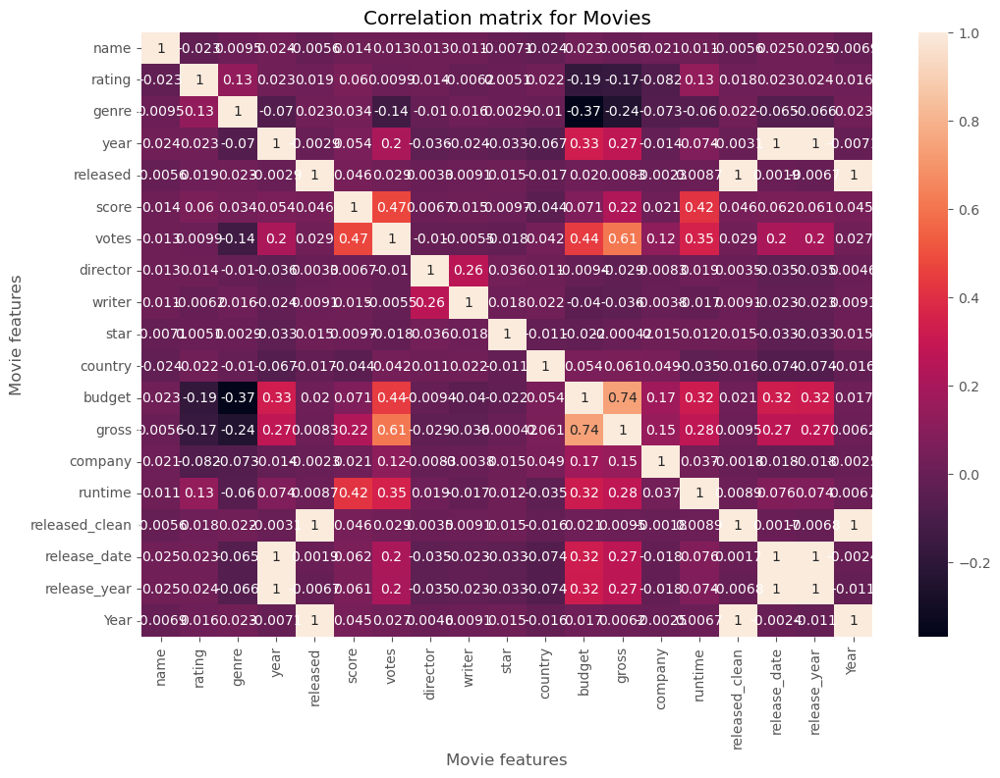

In [127]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [135]:
for col_name in df.columns:
    if(df[col_name].dtype == 'object'):
        df[col_name]= df[col_name].astype('category')
        df[col_name] = df[col_name].cat.codes

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 26.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 67.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 79.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 85.4% of the points cannot be place

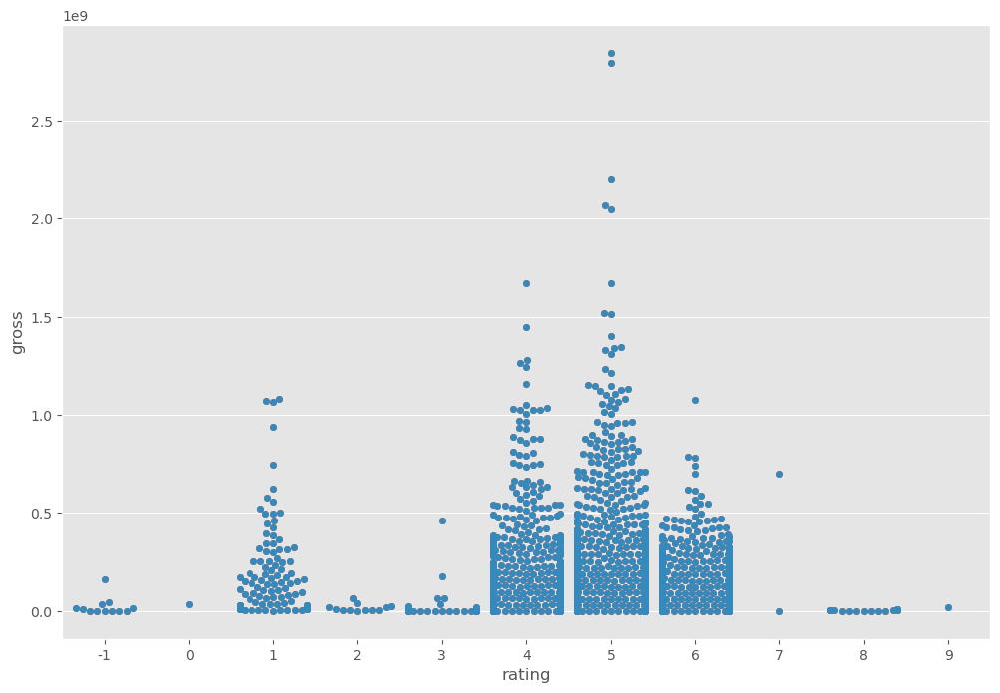